# Setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from collections import defaultdict
import datetime
import numpy as np
from numpy.random import default_rng
import os
import pandas as pd
import pickle
import plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
import pyalex
from pyalex import Authors, Concepts, Institutions, Works
import seaborn as sns
from tqdm.notebook import tqdm
import xarray as xr

from researcher_impact.bootstrap import bootstrap_wrapper, propagate_bootstrap_list, propagate_bootstrap_dict, bootstrap_stats
from researcher_impact.citations import get_bounded_citations
from researcher_impact.processors import OpenAlexProcessor
from researcher_impact.regression import fit_linear_regression, predict
from researcher_impact.utils import dict_to_dataarray
from researcher_impact.plotting import save_plot
from researcher_impact.pyalex_utils import merge_pages, merge_sample

In [3]:
# Number of years after publication year to count citations
CITATION_YEAR_BOUND = 3

In [4]:
BOOTSTRAP_SAMPLE_SIZE = 100

In [5]:
# Create a random number generator, with a fixed random seed for reproducibility
SEED = 20230105
rng = default_rng(seed=SEED)

In [6]:
# The polite pool has much faster and more consistent response times. To get into the polite pool, you set your email:
pyalex.config.email = "ben@epochai.org"

In [7]:
# Configure numpy to display numbers in scientific notation
np.set_printoptions(formatter={'float': '{: .2e}'.format})

In [8]:
# Apply the default theme
sns.set_theme()

In [9]:
pio.templates.default = "plotly_white"

In [10]:
# Location to save data and results
data_file_location = 'data/'
os.makedirs(data_file_location, exist_ok=True)

result_file_location = 'results/'
os.makedirs(result_file_location, exist_ok=True)

# Load dataset

In [47]:
with open(data_file_location + "selected_institution_works_openalex_deduplicated_2023-08-29_12-22-34", "rb") as f:
    works_obj = pickle.load(f)
    works = works_obj["works"]
    selected_institution_ids = works_obj["selected_institution_ids"]
    institution_aliases = works_obj["institution_aliases"]

In [48]:
len(works)

66093

In [49]:
works[0]

{'id': 'https://openalex.org/W2919115771',
 'doi': 'https://doi.org/10.1038/nature14539',
 'title': 'Deep learning',
 'display_name': 'Deep learning',
 'publication_year': 2015,
 'publication_date': '2015-05-27',
 'ids': {'openalex': 'https://openalex.org/W2919115771',
  'doi': 'https://doi.org/10.1038/nature14539',
  'mag': '2919115771',
  'pmid': 'https://pubmed.ncbi.nlm.nih.gov/26017442'},
 'language': 'en',
 'primary_location': {'is_oa': False,
  'landing_page_url': 'https://doi.org/10.1038/nature14539',
  'pdf_url': None,
  'source': {'id': 'https://openalex.org/S137773608',
   'display_name': 'Nature',
   'issn_l': '0028-0836',
   'issn': ['1476-4687', '0028-0836'],
   'is_oa': False,
   'is_in_doaj': False,
   'host_organization': 'https://openalex.org/P4310319908',
   'host_organization_name': 'Nature Portfolio',
   'host_organization_lineage': ['https://openalex.org/P4310319908',
    'https://openalex.org/P4310319965'],
   'host_organization_lineage_names': ['Nature Portfolio'

In [50]:
selected_institution_ids

['https://openalex.org/I1291425158',
 'https://openalex.org/I4210113297',
 'https://openalex.org/I4210100430',
 'https://openalex.org/I4210148186',
 'https://openalex.org/I4210117425',
 'https://openalex.org/I4210131802',
 'https://openalex.org/I4210090411',
 'https://openalex.org/I2252078561',
 'https://openalex.org/I4210114444',
 'https://openalex.org/I4210111288',
 'https://openalex.org/I1290206253',
 'https://openalex.org/I4210164937',
 'https://openalex.org/I4210113369',
 'https://openalex.org/I4210124949',
 'https://openalex.org/I4210105678',
 'https://openalex.org/I4210087053',
 'https://openalex.org/I4210125051',
 'https://openalex.org/I4210162141',
 'https://openalex.org/I4210086099',
 'https://openalex.org/I4210153468',
 'https://openalex.org/I4210161634',
 'https://openalex.org/I4210110431',
 'https://openalex.org/I4210099966',
 'https://openalex.org/I4210108625',
 'https://openalex.org/I4210135422',
 'https://openalex.org/I4210139986',
 'https://openalex.org/I4210109507',
 

In [51]:
institution_aliases

{'https://openalex.org/I1291425158': 'Google',
 'https://openalex.org/I4210113297': 'Google',
 'https://openalex.org/I4210100430': 'Google',
 'https://openalex.org/I4210148186': 'Google',
 'https://openalex.org/I4210117425': 'Google',
 'https://openalex.org/I4210131802': 'Google',
 'https://openalex.org/I4210090411': 'DeepMind',
 'https://openalex.org/I2252078561': 'Meta',
 'https://openalex.org/I4210114444': 'Meta',
 'https://openalex.org/I4210111288': 'Meta',
 'https://openalex.org/I1290206253': 'Microsoft',
 'https://openalex.org/I4210164937': 'Microsoft',
 'https://openalex.org/I4210113369': 'Microsoft',
 'https://openalex.org/I4210124949': 'Microsoft',
 'https://openalex.org/I4210105678': 'Microsoft',
 'https://openalex.org/I4210087053': 'Microsoft',
 'https://openalex.org/I4210125051': 'Microsoft',
 'https://openalex.org/I4210162141': 'Microsoft',
 'https://openalex.org/I4210086099': 'Microsoft',
 'https://openalex.org/I4210153468': 'Microsoft',
 'https://openalex.org/I4210161634

# Data processing

In [52]:
works = np.array(works)  # For indexing

In [53]:
def processor_iter(works):
    processor = OpenAlexProcessor(works, selected_institution_ids, institution_aliases, citation_year_bound=CITATION_YEAR_BOUND)
    processor.process_works()
    return processor

In [54]:
# Without bootstrapping
processor = processor_iter(works)

In [55]:
# With bootstrapping
processor_sample = bootstrap_wrapper(processor_iter, works, rng, bootstrap_size=BOOTSTRAP_SAMPLE_SIZE)

In [56]:
all_years = np.arange(2010, 2023 + 1)

In [57]:
publication_years = list(range(2010, 2020 + 1))

In [58]:
time_series_end_year = 2020

## Whole field

In [27]:
Authors().random()

{'id': 'https://openalex.org/A5070017942',
 'orcid': None,
 'display_name': 'A. Aas-Jakobsen',
 'display_name_alternatives': ['A. Aas-Jakobsen'],
 'works_count': 1,
 'cited_by_count': 0,
 'summary_stats': {'2yr_mean_citedness': 0.0, 'h_index': 0, 'i10_index': 0},
 'ids': {'openalex': 'https://openalex.org/A5070017942'},
 'last_known_institution': None,
 'x_concepts': [{'id': 'https://openalex.org/C41008148',
   'wikidata': 'https://www.wikidata.org/wiki/Q21198',
   'display_name': 'Computer science',
   'level': 0,
   'score': 100.0}],
 'counts_by_year': [],
 'works_api_url': 'https://api.openalex.org/works?filter=author.id:A5070017942',
 'updated_date': '2023-07-21',
 'created_date': '2023-07-21'}

In [411]:
# field_works_sample = []
# for i in range(10):
#     field_works_sample.extend(
#         merge_sample(
#             Works() \
#                 .filter(concepts={"id": concept_query}) \
#                 .filter(from_publication_date="2010-01-01") \
#                 .filter(to_publication_date="2023-06-01"),
#             sample_size=9800,
#             seed=SEED+i,
#         )
#     )

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 25/50 [00:39<00:39,  1.57s/it]


HTTPError: 500 Server Error: INTERNAL SERVER ERROR for url: https://api.openalex.org/works?filter=concepts.id:https://openalex.org/C154945302%7Chttps://openalex.org/C119857082,from_publication_date:2010-01-01,to_publication_date:2023-06-01&sample=9800&seed=20230107&per-page=200&page=26

In [412]:
# len(field_works_sample)

19600

In [413]:
# Remove duplicates
# deduplicated_works = list()
# unique_work_ids = set()
# for work in field_works_sample:
#     if work['id'] not in unique_work_ids:
#         deduplicated_works.append(work)
#         unique_work_ids.add(work['id'])
#     else:
#         duplicate_example = work
# len(deduplicated_works)

19591

In [414]:
# field_works_sample = deduplicated_works

In [421]:
# Save to avoid fetching every time
# timestamp = datetime.datetime.now()
# with open(data_file_location + f"field_works_openalex_{timestamp.strftime('%Y-%m-%d_%H-%M-%S')}", "wb") as f:
#     pickle.dump(field_works_sample, f)

In [422]:
# with open(data_file_location + "selected_institution_works_openalex_2023-06-19_14-37-23", "rb") as f:
#     works_obj = pickle.load(f)
#     works = works_obj["works"]
# len(works)

with open(data_file_location + f"field_works_openalex_2023-07-21_14-34-32", "rb") as f:
    field_works_sample = pickle.load(f)
len(field_works_sample)

19591

In [462]:
field_coauthor_counts = defaultdict(list)
for work in field_works_sample:
    pub_year = work['publication_year']
    field_coauthor_counts[pub_year].append(len(work["authorships"]))

In [463]:
field_coauthor_counts

defaultdict(list,
            {2010: [5,
              3,
              2,
              2,
              1,
              3,
              2,
              6,
              3,
              1,
              1,
              1,
              1,
              3,
              3,
              6,
              1,
              4,
              2,
              2,
              1,
              4,
              4,
              1,
              2,
              1,
              1,
              1,
              1,
              1,
              4,
              3,
              1,
              1,
              3,
              1,
              5,
              1,
              3,
              2,
              1,
              2,
              2,
              7,
              1,
              6,
              4,
              2,
              2,
              1,
              1,
              1,
              1,
              1,
              3,
              1,
              3,
       

In [467]:
field_avg_coauthor_counts = dict_to_dataarray(field_coauthor_counts, "year", val_fn=np.mean)
field_avg_coauthor_counts

<xarray.DataArray (year: 14)>
array([ 2.41e+00,  2.70e+00,  2.61e+00,  2.61e+00,  2.66e+00,  2.83e+00,
        2.91e+00,  2.91e+00,  3.16e+00,  3.19e+00,  3.34e+00,  3.49e+00,
        3.84e+00,  4.00e+00])
Coordinates:
  * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023

In [423]:
field_authors = defaultdict(set)
for work in field_works_sample:
    pub_year = work['publication_year']
    for authorship in work['authorships']:
        author_id = authorship["author"].get("id")
        if author_id is not None:
            field_authors[pub_year].add(author_id)
field_authors

defaultdict(set,
            {2010: {'https://openalex.org/A4341774124',
              'https://openalex.org/A868386659',
              'https://openalex.org/A2157076773',
              'https://openalex.org/A4352943475',
              'https://openalex.org/A4332355702',
              'https://openalex.org/A2397434439',
              'https://openalex.org/A2777106431',
              'https://openalex.org/A4337626145',
              'https://openalex.org/A2288837648',
              'https://openalex.org/A4354163325',
              'https://openalex.org/A4357004594',
              'https://openalex.org/A2628058436',
              'https://openalex.org/A4355784247',
              'https://openalex.org/A4330959042',
              'https://openalex.org/A4356501906',
              'https://openalex.org/A4338687908',
              'https://openalex.org/A229162635',
              'https://openalex.org/A4358949050',
              'https://openalex.org/A4342224751',
              'https://openal

In [424]:
field_author_counts = dict_to_dataarray(field_authors, 'year', len)
field_author_counts

<xarray.DataArray (year: 14)>
array([ 2.83e+03,  3.20e+03,  2.97e+03,  3.44e+03,  3.47e+03,  3.64e+03,
        3.67e+03,  4.00e+03,  4.70e+03,  5.14e+03,  5.93e+03,  6.67e+03,
        6.99e+03,  3.26e+03])
Coordinates:
  * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023

In [425]:
field_citations = defaultdict(list)
for work in field_works_sample:
    pub_year = work["publication_year"]
    citations = get_bounded_citations(
        work, year_bound=CITATION_YEAR_BOUND,
    )
    field_citations[pub_year].append(citations)

In [426]:
field_citations = dict_to_dataarray(field_citations, 'year', sum)
field_citations

<xarray.DataArray (year: 14)>
array([ 1.83e+03,  2.86e+03,  3.44e+03,  3.75e+03,  3.99e+03,  4.34e+03,
        5.16e+03,  6.88e+03,  8.19e+03,  9.47e+03,  9.61e+03,  5.40e+03,
        2.44e+03,  1.15e+02])
Coordinates:
  * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023

## Selected institutions

In [59]:
institution_author_data = propagate_bootstrap_list(lambda processor: processor.get_author_data(), processor_sample)

In [60]:
institution_author_data[0]

defaultdict(<function researcher_impact.processors.OpenAlexProcessor.deduplicate_authors.<locals>.<lambda>()>,
            {'Intel': defaultdict(set,
                         {2018: {'https://openalex.org/A5000796225',
                           'https://openalex.org/A5001386209',
                           'https://openalex.org/A5001459619',
                           'https://openalex.org/A5001690160',
                           'https://openalex.org/A5002020606',
                           'https://openalex.org/A5002085554',
                           'https://openalex.org/A5002286841',
                           'https://openalex.org/A5002868461',
                           'https://openalex.org/A5002997663',
                           'https://openalex.org/A5003069760',
                           'https://openalex.org/A5003660941',
                           'https://openalex.org/A5003681868',
                           'https://openalex.org/A5004032634',
                         

In [61]:
institution_authors_by_work = propagate_bootstrap_list(lambda processor: processor.get_authors_by_work(), processor_sample)

In [62]:
institution_authors_by_work[0]

defaultdict(<function researcher_impact.processors.OpenAlexProcessor.process_works.<locals>.<lambda>()>,
            {'Intel': defaultdict(list,
                         {'https://openalex.org/W2794981775': ['https://openalex.org/A5049783706'],
                          'https://openalex.org/W3015556126': ['https://openalex.org/A5091474691'],
                          'https://openalex.org/W4200589401': ['https://openalex.org/A5077643825',
                           'https://openalex.org/A5041290212',
                           'https://openalex.org/A5077643825',
                           'https://openalex.org/A5041290212'],
                          'https://openalex.org/W4312883229': ['https://openalex.org/A5023138124',
                           'https://openalex.org/A5023138124'],
                          'https://openalex.org/W3091326658': ['https://openalex.org/A5077674730',
                           'https://openalex.org/A5031637729',
                           'https://opena

In [33]:
institution_authors_by_work_distribution = defaultdict(list)
for ins, authors_by_work in institution_authors_by_work.items():
    for work_id, authors in authors_by_work.items():
        institution_authors_by_work_distribution[ins].append(len(authors))
institution_authors_by_work_distribution = {ins:np.array(authors) for ins, authors in institution_authors_by_work_distribution.items()}
institution_authors_by_work_distribution

AttributeError: 'list' object has no attribute 'items'

In [433]:
authors_by_work_distribution = []
for ins, authors_by_work in institution_authors_by_work.items():
    for work_id, author_ids in authors_by_work.items():
        authors_by_work_distribution.append(len(author_ids))
        if len(author_ids) > 50:
            print(work_id)
authors_by_work_distribution = np.array(authors_by_work_distribution)
authors_by_work_distribution.mean()

https://openalex.org/W3197720002
https://openalex.org/W4309233013
https://openalex.org/W4309303298
https://openalex.org/W4362552012
https://openalex.org/W2193413348


2.315722250380132

In [434]:
authors_by_work = []
for ins in institution_authors_by_work.keys():
    for work, authors in institution_authors_by_work[ins].items():
        authors_by_work.append((work, authors))
authors_by_work

[('https://openalex.org/W2194775991',
  ['https://openalex.org/A4344207660',
   'https://openalex.org/A4358260579',
   'https://openalex.org/A2119543935',
   'https://openalex.org/A4358569165']),
 ('https://openalex.org/W639708223',
  ['https://openalex.org/A4344207660', 'https://openalex.org/A4358569165']),
 ('https://openalex.org/W1536680647', ['https://openalex.org/A4358337110']),
 ('https://openalex.org/W1861492603',
  ['https://openalex.org/A1944499404', 'https://openalex.org/A4348855202']),
 ('https://openalex.org/W2031489346', ['https://openalex.org/A4350701002']),
 ('https://openalex.org/W1677182931',
  ['https://openalex.org/A4344207660',
   'https://openalex.org/A2119543935',
   'https://openalex.org/A4358569165']),
 ('https://openalex.org/W2160815625', ['https://openalex.org/A4356376121']),
 ('https://openalex.org/W2146395539', ['https://openalex.org/A4359813164']),
 ('https://openalex.org/W2109255472',
  ['https://openalex.org/A4344207660', 'https://openalex.org/A4358569165

In [435]:
single_author_works = [work for work, authors in authors_by_work if len(authors) == 1]

In [436]:
single_author_test_sample = rng.choice(single_author_works, 10)
for work_id in single_author_test_sample:
    print(work_id, Works()[work_id]['doi'])

https://openalex.org/W2965128575 https://doi.org/10.1145/3306305.3332370
https://openalex.org/W2603428138 https://doi.org/10.1109/csci.2016.0109
https://openalex.org/W2985839894 https://doi.org/10.48550/arxiv.1911.02035
https://openalex.org/W3178118041 https://doi.org/10.1007/s10115-021-01587-z
https://openalex.org/W3091492359 https://doi.org/10.1109/ijcnn48605.2020.9207663
https://openalex.org/W2921887948 None
https://openalex.org/W2604035270 None
https://openalex.org/W2098018055 None
https://openalex.org/W3093370337 https://doi.org/10.1145/3394171.3414015
https://openalex.org/W3194864635 https://doi.org/10.48550/arxiv.1502.03708


In [437]:
test_sample = rng.choice(works, 10)
for work in test_sample:
    print(work['id'], work['doi'])

https://openalex.org/W2963097937 https://doi.org/10.1109/cvpr.2018.00872
https://openalex.org/W3164208111 https://doi.org/10.1016/j.asoc.2021.107511
https://openalex.org/W2971329390 https://doi.org/10.18653/v1/d19-1295
https://openalex.org/W2949150022 https://doi.org/10.18653/v1/p19-1380
https://openalex.org/W2950437448 https://doi.org/10.48550/arxiv.1808.03405
https://openalex.org/W2171890583 https://doi.org/10.1109/tmm.2011.2162581
https://openalex.org/W3015299720 https://doi.org/10.1109/icassp40776.2020.9054111
https://openalex.org/W2980706162 https://doi.org/10.1145/3332165.3347881
https://openalex.org/W2945880171 None
https://openalex.org/W4312500479 https://doi.org/10.1109/iros47612.2022.9981418


In [438]:
Works()["https://openalex.org/W2105103433"]

{'id': 'https://openalex.org/W2105103433',
 'doi': None,
 'title': 'Overview of the 2012 Shared Task on Parsing the Web',
 'display_name': 'Overview of the 2012 Shared Task on Parsing the Web',
 'publication_year': 2012,
 'publication_date': '2012-01-01',
 'ids': {'openalex': 'https://openalex.org/W2105103433', 'mag': '2105103433'},
 'language': 'en',
 'primary_location': {'is_oa': False,
  'landing_page_url': 'http://static.googleusercontent.com/external_content/untrusted_dlcp/research.google.com/en/us/pubs/archive/38278.pdf',
  'pdf_url': None,
  'source': None,
  'license': None,
  'version': None},
 'type': 'article',
 'type_crossref': 'journal-article',
 'open_access': {'is_oa': False,
  'oa_status': 'closed',
  'oa_url': None,
  'any_repository_has_fulltext': False},
 'authorships': [{'author_position': 'first',
   'author': {'id': 'https://openalex.org/A4359057943',
    'display_name': 'Slav Petrov',
    'orcid': None},
   'institutions': [{'id': 'https://openalex.org/I129142515

<Axes: ylabel='Count'>

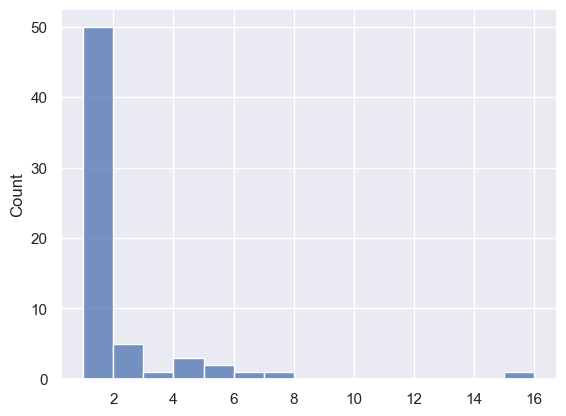

In [439]:
sns.histplot(institution_authors_by_work_distribution['OpenAI'], binwidth=1, log_scale=(False, False))

In [63]:
institution_author_name_data = processor.get_author_name_data()

In [64]:
institution_author_counts = propagate_bootstrap_list(lambda processor: processor.get_author_counts(), processor_sample)

In [65]:
institution_author_counts

[{'Intel': <xarray.DataArray (year: 14)>
  array([ 2.09e+02,  2.68e+02,  2.56e+02,  3.04e+02,  3.11e+02,  3.38e+02,
          3.22e+02,  3.33e+02,  3.79e+02,  4.84e+02,  5.36e+02,  5.68e+02,
          4.26e+02,  2.20e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Amazon': <xarray.DataArray (year: 14)>
  array([ 5.00e+00,  9.00e+00,  1.30e+01,  1.40e+01,  2.50e+01,  4.30e+01,
          5.00e+01,  8.90e+01,  1.95e+02,  3.73e+02,  5.07e+02,  7.32e+02,
          5.87e+02,  3.30e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Microsoft': <xarray.DataArray (year: 14)>
  array([ 5.80e+02,  5.71e+02,  6.11e+02,  6.50e+02,  7.01e+02,  6.17e+02,
          6.13e+02,  5.72e+02,  6.53e+02,  9.09e+02,  1.11e+03,  1.24e+03,
          8.47e+02,  4.97e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Google': <xarray.DataArray (y

In [82]:
institution_citations = propagate_bootstrap_list(lambda processor: processor.get_bounded_citations(), processor_sample)

In [83]:
institution_citations

[{'Intel': <xarray.DataArray (year: 14)>
  array([ 1.85e+03,  4.10e+03,  2.59e+03,  2.60e+03,  3.25e+03,  2.39e+03,
          3.89e+03,  8.60e+03,  4.81e+03,  7.29e+03,  8.51e+03,  5.16e+03,
          1.18e+03,  6.90e+01])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Amazon': <xarray.DataArray (year: 14)>
  array([ 3.00e+00,  3.80e+01,  6.20e+01,  3.21e+02,  2.55e+02,  8.71e+02,
          5.84e+02,  1.96e+03,  6.12e+03,  9.09e+03,  1.41e+04,  4.55e+03,
          1.11e+03,  8.60e+01])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Microsoft': <xarray.DataArray (year: 14)>
  array([ 9.30e+03,  1.80e+04,  1.43e+04,  2.18e+04,  1.97e+04,  2.60e+04,
          2.47e+04,  2.97e+04,  3.31e+04,  3.83e+04,  3.48e+04,  2.37e+04,
          3.14e+03,  2.29e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Google': <xarray.DataArray (y

In [84]:
institution_work_counts = propagate_bootstrap_list(lambda processor: processor.get_work_counts(), processor_sample)

In [85]:
institution_work_counts

[{'Intel': <xarray.DataArray (year: 14)>
  array([ 2.75e+02,  3.39e+02,  2.75e+02,  3.10e+02,  3.29e+02,  3.27e+02,
          3.52e+02,  3.43e+02,  3.17e+02,  4.67e+02,  4.82e+02,  5.32e+02,
          3.80e+02,  1.77e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Amazon': <xarray.DataArray (year: 14)>
  array([ 6.00e+00,  1.30e+01,  1.70e+01,  2.00e+01,  3.80e+01,  4.90e+01,
          6.50e+01,  1.06e+02,  2.13e+02,  4.03e+02,  5.39e+02,  7.44e+02,
          4.62e+02,  2.26e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Microsoft': <xarray.DataArray (year: 14)>
  array([ 9.10e+02,  9.64e+02,  9.95e+02,  1.12e+03,  1.04e+03,  9.50e+02,
          8.80e+02,  9.23e+02,  1.05e+03,  1.26e+03,  1.49e+03,  1.58e+03,
          9.08e+02,  4.64e+02])
  Coordinates:
    * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
  'Google': <xarray.DataArray (y

In [86]:
institution_individual_citations = propagate_bootstrap_list(lambda processor: processor.get_individual_bounded_citations(), processor_sample)

In [87]:
institution_individual_citations

[{'Intel': array([ 0,  0,  5, ...,  2, 22, 13]),
  'Amazon': array([5, 5, 1, ..., 1, 0, 0]),
  'Microsoft': array([4, 4, 0, ..., 0, 0, 0]),
  'Google': array([ 4,  0,  2, ...,  2,  2, 15]),
  'Nvidia': array([ 0,  6,  0, ...,  7, 26,  9]),
  'Adobe': array([ 9,  0, 19, ...,  7, 32, 20]),
  'Tencent': array([42,  0, 12, ...,  0, 20,  9]),
  'Group Sense': array([  42,  188,   34,    2,   16,   82,    3,    6,    0,   10,   74,
            0,   14,    1,    2,    0,  109,   65,   55,   49,   61,  197,
            3,   42,    6,   13,  121,    0,    5,   94,   74,   17,   19,
            1,    0,  179,   39,  873,    0,   13,   16,   12,    6,    2,
           49,  197,   53,   26,   55,   16,    7,   16,   16,   79,   31,
          105,   49,   16,    0,  105,  188,    9,    2,   13,   26,   85,
          188,  194,    3,    0,   26,    6,   31,   27,   12,    2,    0,
          185,   13,   82,   16,    2,   94,   31,    0,    6,    2,  197,
           24,    2,  105,   10,    6,   13, 

In [88]:
institutions_coauthor_counts = propagate_bootstrap_list(lambda processor: processor.get_coauthor_counts(), processor_sample)

In [89]:
def get_combined_coauthor_counts(institutions_coauthor_counts):
    combined_coauthor_counts = defaultdict(list)
    for ins, counts_by_year in institutions_coauthor_counts.items():
        for year, counts in counts_by_year.items():
            combined_coauthor_counts[year].extend(counts)
    return combined_coauthor_counts

combined_coauthor_counts = propagate_bootstrap_list(get_combined_coauthor_counts, institutions_coauthor_counts)

In [90]:
combined_avg_coauthor_counts = propagate_bootstrap_list(
    lambda combined_coauthor_counts: dict_to_dataarray(combined_coauthor_counts, 'year', lambda x: np.mean(x)),
    combined_coauthor_counts,
)
combined_avg_coauthor_counts

[<xarray.DataArray (year: 14)>
 array([ 3.69e+00,  3.97e+00,  3.88e+00,  4.08e+00,  4.20e+00,  4.36e+00,
         4.41e+00,  4.62e+00,  4.99e+00,  5.32e+00,  5.63e+00,  5.82e+00,
         6.24e+00,  6.32e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 3.65e+00,  3.86e+00,  3.87e+00,  3.96e+00,  4.12e+00,  4.28e+00,
         4.52e+00,  4.71e+00,  4.98e+00,  5.24e+00,  5.75e+00,  5.83e+00,
         6.32e+00,  6.25e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 3.65e+00,  3.83e+00,  3.91e+00,  4.00e+00,  4.16e+00,  4.37e+00,
         4.50e+00,  4.73e+00,  4.91e+00,  5.21e+00,  5.60e+00,  5.89e+00,
         6.22e+00,  6.37e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 3.65e+00,  3.88e+00,  3.94e+00,  4.03e+00,

In [91]:
combined_std_coauthor_counts = propagate_bootstrap_list(
    lambda combined_coauthor_counts: dict_to_dataarray(combined_coauthor_counts, 'year', lambda x: np.std(x)),
    combined_coauthor_counts,
)
combined_std_coauthor_counts

[<xarray.DataArray (year: 14)>
 array([ 2.17e+00,  3.26e+00,  2.18e+00,  2.61e+00,  2.64e+00,  2.80e+00,
         2.55e+00,  2.67e+00,  3.05e+00,  4.71e+00,  4.93e+00,  4.53e+00,
         5.66e+00,  4.87e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 1.92e+00,  2.50e+00,  1.98e+00,  2.08e+00,  2.59e+00,  2.43e+00,
         4.17e+00,  3.23e+00,  3.09e+00,  4.56e+00,  5.64e+00,  4.36e+00,
         5.70e+00,  4.74e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 2.09e+00,  2.76e+00,  2.08e+00,  2.16e+00,  2.63e+00,  2.54e+00,
         2.97e+00,  3.21e+00,  2.77e+00,  4.40e+00,  4.95e+00,  4.89e+00,
         5.45e+00,  5.60e+00])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 2.00e+00,  2.74e+00,  2.08e+00,  2.20e+00,

In [111]:
def get_institution_citations_per_author(idx):
    institution_citations_i = institution_citations[idx]
    institution_author_counts_i = institution_author_counts[idx]
    institution_citations_per_author = {}
    for ins, citation_counts in institution_citations_i.items():
        citations_per_author = citation_counts / institution_author_counts_i[ins]
        institution_citations_per_author[ins] = np.nan_to_num(citations_per_author)
    return institution_citations_per_author

institution_citations_per_author = propagate_bootstrap_list(get_institution_citations_per_author, range(len(processor_sample)))
institution_citations_per_author

[{'Intel': array([ 8.85e+00,  1.53e+01,  1.01e+01,  8.54e+00,  1.05e+01,  7.07e+00,
          1.21e+01,  2.58e+01,  1.27e+01,  1.51e+01,  1.59e+01,  9.09e+00,
          2.78e+00,  3.14e-01]),
  'Amazon': array([ 6.00e-01,  4.22e+00,  4.77e+00,  2.29e+01,  1.02e+01,  2.03e+01,
          1.17e+01,  2.20e+01,  3.14e+01,  2.44e+01,  2.79e+01,  6.21e+00,
          1.89e+00,  2.61e-01]),
  'Microsoft': array([ 1.60e+01,  3.15e+01,  2.33e+01,  3.35e+01,  2.81e+01,  4.21e+01,
          4.03e+01,  5.20e+01,  5.07e+01,  4.22e+01,  3.15e+01,  1.91e+01,
          3.70e+00,  4.61e-01]),
  'Google': array([ 2.03e+01,  1.75e+01,  1.78e+01,  3.60e+01,  6.46e+01,  7.18e+01,
          9.62e+01,  1.32e+02,  6.81e+01,  5.94e+01,  4.11e+01,  1.11e+01,
          3.59e+00,  2.61e-01]),
  'Nvidia': array([ 2.53e+00,  1.38e+01,  1.76e+01,  2.23e+01,  6.62e+00,  1.96e+01,
          8.80e+01,  7.10e+01,  9.66e+01,  7.23e+01,  3.59e+01,  1.00e+01,
          4.94e+00,  2.79e-01]),
  'Adobe': array([ 2.31e+01,  2.5

In [112]:
def get_total_author_counts(institution_author_counts):
    total_author_counts = xr.DataArray(np.zeros(len(all_years)), dims=['year'], coords={'year': all_years})
    for ins, author_counts in institution_author_counts.items():
        for count in author_counts:
            if count.year.item() in all_years:
                total_author_counts.loc[count.year] += count
    return total_author_counts

total_author_counts = propagate_bootstrap_list(
    lambda institution_author_counts_: get_total_author_counts(institution_author_counts_),
    institution_author_counts,
)
total_author_counts

[<xarray.DataArray (year: 14)>
 array([ 1.90e+03,  2.19e+03,  2.21e+03,  2.36e+03,  2.46e+03,  2.63e+03,
         3.04e+03,  3.50e+03,  4.87e+03,  7.02e+03,  8.60e+03,  9.78e+03,
         7.61e+03,  4.02e+03])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 1.90e+03,  2.15e+03,  2.20e+03,  2.46e+03,  2.47e+03,  2.63e+03,
         3.14e+03,  3.54e+03,  4.88e+03,  7.04e+03,  8.60e+03,  9.94e+03,
         7.81e+03,  3.88e+03])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 1.94e+03,  2.18e+03,  2.16e+03,  2.43e+03,  2.40e+03,  2.65e+03,
         3.06e+03,  3.56e+03,  4.96e+03,  7.07e+03,  8.58e+03,  9.90e+03,
         7.62e+03,  3.98e+03])
 Coordinates:
   * year     (year) int64 2010 2011 2012 2013 2014 ... 2019 2020 2021 2022 2023,
 <xarray.DataArray (year: 14)>
 array([ 1.89e+03,  2.17e+03,  2.18e+03,  2.41e+03,

In [113]:
institution_mean_authors = propagate_bootstrap_dict(lambda x: x.mean().item(), institution_author_counts)
institution_mean_authors

[{'Intel': 353.85714285714283,
  'Amazon': 212.28571428571428,
  'Microsoft': 726.1428571428571,
  'Google': 715.3571428571429,
  'Nvidia': 103.71428571428571,
  'Adobe': 92.85714285714286,
  'Tencent': 196.71428571428572,
  'Group Sense': 53.416666666666664,
  'Huawei': 318.35714285714283,
  'Twitter': 33.357142857142854,
  'IBM': 734.2857142857143,
  'Alibaba': 247.64285714285714,
  'Baidu': 125.57142857142857,
  'Meta': 220.85714285714286,
  'Yandex': 14.357142857142858,
  'Netflix': 12.833333333333334,
  'DeepMind': 101.72727272727273,
  'Xerox': 35.07692307692308,
  'NEC': 105.35714285714286,
  'Salesforce': 18.555555555555557,
  'Uber': 21.11111111111111,
  'Naver': 40.57142857142857,
  'OpenAI': 10.25,
  'Enthought': 1.0,
  'Quansight': 4.0},
 {'Meta': 217.92857142857142,
  'Baidu': 131.92857142857142,
  'Google': 732.0,
  'Intel': 361.14285714285717,
  'IBM': 738.2142857142857,
  'Twitter': 34.5,
  'Microsoft': 730.5,
  'Amazon': 207.64285714285714,
  'Tencent': 193.28571428571

In [114]:
institution_mean_authors_stats = bootstrap_stats(institution_mean_authors)
institution_mean_authors_stats

defaultdict(dict,
            {'Intel': {'mean': 361.92428571428565,
              'median': 361.82142857142856,
              'std': 5.492683630921024,
              'ci': array([ 3.53e+02,  3.72e+02])},
             'Amazon': {'mean': 213.77142857142854,
              'median': 213.85714285714286,
              'std': 3.8857274159442015,
              'ci': array([ 2.08e+02,  2.20e+02])},
             'Microsoft': {'mean': 729.7671428571429,
              'median': 729.75,
              'std': 5.099636041434917,
              'ci': array([ 7.21e+02,  7.38e+02])},
             'Google': {'mean': 723.2585714285715,
              'median': 722.9642857142858,
              'std': 7.51072552814864,
              'ci': array([ 7.12e+02,  7.35e+02])},
             'Nvidia': {'mean': 103.45571428571428,
              'median': 103.46428571428572,
              'std': 2.1541317678984697,
              'ci': array([ 9.99e+01,  1.08e+02])},
             'Adobe': {'mean': 95.48285714285716,
    

In [225]:
institution_total_work_counts = propagate_bootstrap_dict(lambda x: x.sum().item(), institution_work_counts)
institution_total_work_counts

[{'Intel': 4905.0,
  'Amazon': 2901.0,
  'Microsoft': 14536.0,
  'Google': 10066.0,
  'Nvidia': 1599.0,
  'Adobe': 2377.0,
  'Tencent': 3556.0,
  'Group Sense': 661.0,
  'Huawei': 5170.0,
  'Twitter': 336.0,
  'IBM': 9559.0,
  'Alibaba': 3397.0,
  'Baidu': 1899.0,
  'Meta': 3459.0,
  'Yandex': 248.0,
  'Netflix': 200.0,
  'DeepMind': 785.0,
  'Xerox': 548.0,
  'NEC': 1267.0,
  'Salesforce': 210.0,
  'Uber': 220.0,
  'Naver': 602.0,
  'OpenAI': 72.0,
  'Enthought': 4.0,
  'Quansight': 1.0},
 {'Meta': 3275.0,
  'Baidu': 1996.0,
  'Google': 10079.0,
  'Intel': 4922.0,
  'IBM': 9803.0,
  'Twitter': 355.0,
  'Microsoft': 14620.0,
  'Amazon': 2870.0,
  'Tencent': 3470.0,
  'Alibaba': 3408.0,
  'Huawei': 5192.0,
  'Adobe': 2308.0,
  'Group Sense': 730.0,
  'NEC': 1355.0,
  'Naver': 569.0,
  'DeepMind': 733.0,
  'Xerox': 504.0,
  'Nvidia': 1560.0,
  'Yandex': 221.0,
  'Netflix': 182.0,
  'OpenAI': 65.0,
  'Uber': 235.0,
  'Enthought': 11.0,
  'Salesforce': 214.0,
  'Quansight': 6.0},
 {'Alibab

In [223]:
institution_total_work_counts_stats = bootstrap_stats(institution_total_work_counts)
institution_total_work_counts_stats

defaultdict(dict,
            {'Intel': {'mean': 4935.18,
              'median': 4931.5,
              'std': 63.04401319713078,
              'ci': array([ 4.84e+03,  5.05e+03])},
             'Amazon': {'mean': 2951.51,
              'median': 2951.0,
              'std': 56.440675935002766,
              'ci': array([ 2.87e+03,  3.04e+03])},
             'Microsoft': {'mean': 14534.47,
              'median': 14531.5,
              'std': 115.29071558456039,
              'ci': array([ 1.43e+04,  1.47e+04])},
             'Google': {'mean': 10098.79,
              'median': 10084.0,
              'std': 94.44853572184167,
              'ci': array([ 9.97e+03,  1.02e+04])},
             'Nvidia': {'mean': 1576.52,
              'median': 1573.5,
              'std': 40.548854484436426,
              'ci': array([ 1.51e+03,  1.65e+03])},
             'Adobe': {'mean': 2333.16,
              'median': 2332.0,
              'std': 49.07091195402833,
              'ci': array([ 2.26e+03

In [200]:
institution_total_citations = propagate_bootstrap_dict(lambda x: x.sum().item(), institution_citations)
institution_total_citations

[{'Intel': 56289.0,
  'Amazon': 39175.0,
  'Microsoft': 296786.0,
  'Google': 443247.0,
  'Nvidia': 52255.0,
  'Adobe': 50384.0,
  'Tencent': 57990.0,
  'Group Sense': 26836.0,
  'Huawei': 57138.0,
  'Twitter': 10550.0,
  'IBM': 98665.0,
  'Alibaba': 36994.0,
  'Baidu': 32122.0,
  'Meta': 207353.0,
  'Yandex': 4479.0,
  'Netflix': 2038.0,
  'DeepMind': 61858.0,
  'Xerox': 5986.0,
  'NEC': 12006.0,
  'Salesforce': 4296.0,
  'Uber': 6951.0,
  'Naver': 12745.0,
  'OpenAI': 19295.0,
  'Enthought': 7590.0,
  'Quansight': 7530.0},
 {'Meta': 166109.0,
  'Baidu': 37831.0,
  'Google': 491113.0,
  'Intel': 58703.0,
  'IBM': 111112.0,
  'Twitter': 10349.0,
  'Microsoft': 342131.0,
  'Amazon': 47852.0,
  'Tencent': 54935.0,
  'Alibaba': 40572.0,
  'Huawei': 55794.0,
  'Adobe': 51330.0,
  'Group Sense': 34544.0,
  'NEC': 12761.0,
  'Naver': 13653.0,
  'DeepMind': 57518.0,
  'Xerox': 5963.0,
  'Nvidia': 52484.0,
  'Yandex': 2415.0,
  'Netflix': 1844.0,
  'OpenAI': 5243.0,
  'Uber': 7712.0,
  'Enthou

In [201]:
institution_total_citations_stats = bootstrap_stats(institution_total_citations)
institution_total_citations_stats

defaultdict(dict,
            {'Intel': {'mean': 57488.42,
              'median': 57401.5,
              'std': 3215.220213857832,
              'ci': array([ 5.25e+04,  6.28e+04])},
             'Amazon': {'mean': 39907.08,
              'median': 39184.5,
              'std': 7055.819230507538,
              'ci': array([ 3.07e+04,  5.27e+04])},
             'Microsoft': {'mean': 337009.99,
              'median': 334844.5,
              'std': 28380.95711546564,
              'ci': array([ 2.98e+05,  3.90e+05])},
             'Google': {'mean': 439397.89,
              'median': 441602.5,
              'std': 31811.026493621674,
              'ci': array([ 3.91e+05,  4.91e+05])},
             'Nvidia': {'mean': 48893.58,
              'median': 48365.5,
              'std': 6476.326452828022,
              'ci': array([ 3.89e+04,  5.97e+04])},
             'Adobe': {'mean': 54396.27,
              'median': 53992.0,
              'std': 3327.6264539608414,
              'ci': array

In [115]:
institution_mean_citations = propagate_bootstrap_dict(lambda x: x.mean().item(), institution_citations)
institution_mean_citations

[{'Intel': 4020.6428571428573,
  'Amazon': 2798.214285714286,
  'Microsoft': 21199.0,
  'Google': 31660.5,
  'Nvidia': 3732.5,
  'Adobe': 3598.8571428571427,
  'Tencent': 4142.142857142857,
  'Group Sense': 2236.3333333333335,
  'Huawei': 4081.285714285714,
  'Twitter': 753.5714285714286,
  'IBM': 7047.5,
  'Alibaba': 2642.4285714285716,
  'Baidu': 2294.4285714285716,
  'Meta': 14810.92857142857,
  'Yandex': 319.92857142857144,
  'Netflix': 169.83333333333334,
  'DeepMind': 5623.454545454545,
  'Xerox': 460.46153846153845,
  'NEC': 857.5714285714286,
  'Salesforce': 477.3333333333333,
  'Uber': 772.3333333333334,
  'Naver': 910.3571428571429,
  'OpenAI': 2411.875,
  'Enthought': 2530.0,
  'Quansight': 7530.0},
 {'Meta': 11864.92857142857,
  'Baidu': 2702.214285714286,
  'Google': 35079.5,
  'Intel': 4193.071428571428,
  'IBM': 7936.571428571428,
  'Twitter': 739.2142857142857,
  'Microsoft': 24437.928571428572,
  'Amazon': 3418.0,
  'Tencent': 3923.9285714285716,
  'Alibaba': 2898.0,
 

In [116]:
institution_mean_citations_stats = bootstrap_stats(institution_mean_citations)
institution_mean_citations_stats

defaultdict(dict,
            {'Intel': {'mean': 4106.315714285714,
              'median': 4100.107142857143,
              'std': 229.65858670413078,
              'ci': array([ 3.75e+03,  4.49e+03])},
             'Amazon': {'mean': 2850.505714285714,
              'median': 2798.892857142857,
              'std': 503.98708789339565,
              'ci': array([ 2.19e+03,  3.76e+03])},
             'Microsoft': {'mean': 24072.14214285714,
              'median': 23917.464285714286,
              'std': 2027.2112225332603,
              'ci': array([ 2.13e+04,  2.78e+04])},
             'Google': {'mean': 31385.563571428578,
              'median': 31543.035714285714,
              'std': 2272.216178115834,
              'ci': array([ 2.79e+04,  3.51e+04])},
             'Nvidia': {'mean': 3492.398571428572,
              'median': 3454.6785714285716,
              'std': 462.59474663057307,
              'ci': array([ 2.78e+03,  4.26e+03])},
             'Adobe': {'mean': 3885.447857

In [117]:
institution_mean_citations_per_author = propagate_bootstrap_dict(lambda x: x.mean().item(), institution_citations_per_author)
institution_mean_citations_per_author

[{'Intel': 11.00360007742317,
  'Amazon': 13.476066080647154,
  'Microsoft': 29.609326445903655,
  'Google': 45.71802305460692,
  'Nvidia': 32.96427928853367,
  'Adobe': 43.65171242527082,
  'Tencent': 18.714802742414804,
  'Group Sense': 49.68093177883771,
  'Huawei': 12.578211528889867,
  'Twitter': 18.655936553008214,
  'IBM': 8.827507643523619,
  'Alibaba': 12.173778789081652,
  'Baidu': 19.916111007660415,
  'Meta': 93.68415074770614,
  'Yandex': 19.129817647573454,
  'Netflix': 16.742968374218375,
  'DeepMind': 60.357828001878765,
  'Xerox': 13.025372113645188,
  'NEC': 8.654787758370293,
  'Salesforce': 80.70141895141894,
  'Uber': 29.03779967374155,
  'Naver': 16.00754591754068,
  'OpenAI': 251.60150335775333,
  'Enthought': 2530.0,
  'Quansight': 1882.5},
 {'Meta': 75.752376219084,
  'Baidu': 20.67261141138715,
  'Google': 45.15895731601535,
  'Intel': 11.412615118992482,
  'IBM': 9.879954651871657,
  'Twitter': 17.680134563489133,
  'Microsoft': 34.24732320144543,
  'Amazon':

In [118]:
institution_mean_citations_per_author_stats = bootstrap_stats(institution_mean_citations_per_author)
institution_mean_citations_per_author_stats

defaultdict(dict,
            {'Intel': {'mean': 11.079872647110935,
              'median': 11.065626078446599,
              'std': 0.608891513708294,
              'ci': array([ 1.01e+01,  1.20e+01])},
             'Amazon': {'mean': 14.339938706780247,
              'median': 14.368181102141019,
              'std': 1.4069613977732565,
              'ci': array([ 1.21e+01,  1.66e+01])},
             'Microsoft': {'mean': 34.04735840969845,
              'median': 33.861764874367466,
              'std': 3.337096247580979,
              'ci': array([ 2.97e+01,  3.98e+01])},
             'Google': {'mean': 44.79733001530111,
              'median': 44.94107815062296,
              'std': 3.3799410243343067,
              'ci': array([ 4.01e+01,  5.13e+01])},
             'Nvidia': {'mean': 28.92342401768423,
              'median': 28.364026489776215,
              'std': 3.4050603459265836,
              'ci': array([ 2.36e+01,  3.48e+01])},
             'Adobe': {'mean': 43.6442508

In [133]:
institution_mean_citations_per_author_means = {ins:stats['mean'] for ins, stats in institution_mean_citations_per_author_stats.items()}
institution_mean_citations_per_author_means

{'Intel': 11.079872647110935,
 'Amazon': 14.339938706780247,
 'Microsoft': 34.04735840969845,
 'Google': 44.79733001530111,
 'Nvidia': 28.92342401768423,
 'Adobe': 43.6442508738728,
 'Tencent': 18.707194833190453,
 'Group Sense': 57.30786100513362,
 'Huawei': 12.493333882553623,
 'Twitter': 19.93574168324872,
 'IBM': 9.5168493991221,
 'Alibaba': 13.558222225390558,
 'Baidu': 20.906498217364778,
 'Meta': 85.23464813462512,
 'Yandex': 16.655284267850288,
 'Netflix': 15.218944078988514,
 'DeepMind': 65.05956718540841,
 'Xerox': 12.955088383151253,
 'NEC': 8.46115477566683,
 'Salesforce': 36.38490839873046,
 'Uber': 24.635109058081174,
 'Naver': 17.883672828944533,
 'OpenAI': 290.7936938424021,
 'Enthought': 1719.1814387755103,
 'Quansight': 4647.50625}

In [124]:
for ins, stats in institution_mean_citations_per_author_stats.items():
    print(ins, stats['ci'])

Intel [ 1.01e+01  1.20e+01]
Amazon [ 1.21e+01  1.66e+01]
Microsoft [ 2.97e+01  3.98e+01]
Google [ 4.01e+01  5.13e+01]
Nvidia [ 2.36e+01  3.48e+01]
Adobe [ 3.96e+01  4.75e+01]
Tencent [ 1.68e+01  2.10e+01]
Group Sense [ 4.26e+01  7.26e+01]
Huawei [ 1.14e+01  1.36e+01]
Twitter [ 1.34e+01  2.83e+01]
IBM [ 8.92e+00  1.00e+01]
Alibaba [ 1.18e+01  1.53e+01]
Baidu [ 1.83e+01  2.45e+01]
Meta [ 6.01e+01  1.15e+02]
Yandex [ 1.08e+01  2.31e+01]
Netflix [ 1.13e+01  1.93e+01]
DeepMind [ 4.59e+01  8.69e+01]
Xerox [ 1.00e+01  1.68e+01]
NEC [ 7.38e+00  1.00e+01]
Salesforce [ 1.84e+01  7.12e+01]
Uber [ 1.81e+01  3.09e+01]
Naver [ 1.12e+01  2.50e+01]
OpenAI [ 1.17e+02  6.84e+02]
Enthought [ 1.85e+02  3.78e+03]
Quansight [ 0.00e+00  1.29e+04]


## Sense checks

In [ ]:
Works().filter(authorships={"institutions": {"id": "https://openalex.org/I4210098317"}}).get()

[{'id': 'https://openalex.org/W3103145119',
  'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
  'title': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'display_name': 'SciPy 1.0: fundamental algorithms for scientific computing in Python',
  'publication_year': 2020,
  'publication_date': '2020-02-03',
  'ids': {'openalex': 'https://openalex.org/W3103145119',
   'doi': 'https://doi.org/10.1038/s41592-019-0686-2',
   'mag': '3103145119'},
  'language': 'en',
  'primary_location': {'is_oa': True,
   'landing_page_url': 'https://doi.org/10.1038/s41592-019-0686-2',
   'pdf_url': 'https://www.nature.com/articles/s41592-019-0686-2.pdf',
   'source': {'id': 'https://openalex.org/S127827428',
    'display_name': 'Nature Methods',
    'issn_l': '1548-7091',
    'issn': ['1548-7105', '1548-7091'],
    'is_oa': False,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/P4310319908',
    'host_organization_name': 'Nature Portfolio',
    'host_orga

In [44]:
Works().search("Attention is all you need").get()

[{'id': 'https://openalex.org/W2963403868',
  'doi': None,
  'title': 'Attention is All you Need',
  'display_name': 'Attention is All you Need',
  'relevance_score': 19837.861,
  'publication_year': 2017,
  'publication_date': '2017-06-12',
  'ids': {'openalex': 'https://openalex.org/W2963403868', 'mag': '2963403868'},
  'language': 'en',
  'primary_location': {'is_oa': False,
   'landing_page_url': 'https://arxiv.org/pdf/1706.03762v5',
   'pdf_url': None,
   'source': {'id': 'https://openalex.org/S4306400194',
    'display_name': 'arXiv (Cornell University)',
    'issn_l': None,
    'issn': None,
    'is_oa': True,
    'is_in_doaj': False,
    'host_organization': 'https://openalex.org/I205783295',
    'host_organization_name': 'Cornell University',
    'host_organization_lineage': ['https://openalex.org/I205783295'],
    'host_organization_lineage_names': ['Cornell University'],
    'type': 'repository'},
   'license': None,
   'version': None},
  'type': 'proceedings-article',
  'o

In [45]:
Works().search("Language models are few-shot learners").get()[0]

{'id': 'https://openalex.org/W3030163527',
 'doi': None,
 'title': 'Language Models are Few-Shot Learners',
 'display_name': 'Language Models are Few-Shot Learners',
 'relevance_score': 6737.9004,
 'publication_year': 2020,
 'publication_date': '2020-05-28',
 'ids': {'openalex': 'https://openalex.org/W3030163527', 'mag': '3030163527'},
 'language': 'en',
 'primary_location': {'is_oa': False,
  'landing_page_url': 'https://arxiv.org/pdf/2005.14165.pdf',
  'pdf_url': None,
  'source': {'id': 'https://openalex.org/S4306400194',
   'display_name': 'arXiv (Cornell University)',
   'issn_l': None,
   'issn': None,
   'is_oa': True,
   'is_in_doaj': False,
   'host_organization': 'https://openalex.org/I205783295',
   'host_organization_name': 'Cornell University',
   'host_organization_lineage': ['https://openalex.org/I205783295'],
   'host_organization_lineage_names': ['Cornell University'],
   'type': 'repository'},
  'license': None,
  'version': None},
 'type': 'posted-content',
 'open_ac

In [46]:
Authors().search("Marcin Andrychowicz").get()

[{'id': 'https://openalex.org/A4354454818',
  'orcid': None,
  'display_name': 'Marcin Andrychowicz',
  'display_name_alternatives': [],
  'relevance_score': 6563.8486,
  'works_count': 50,
  'cited_by_count': 4253,
  'summary_stats': {'2yr_mean_citedness': 0.08333333333333333,
   'h_index': 22,
   'i10_index': 31},
  'ids': {'openalex': 'https://openalex.org/A4354454818'},
  'last_known_institution': {'id': 'https://openalex.org/I1291425158',
   'ror': 'https://ror.org/00njsd438',
   'display_name': 'Google (United States)',
   'country_code': 'US',
   'type': 'company'},
  'x_concepts': [{'id': 'https://openalex.org/C41008148',
    'wikidata': 'https://www.wikidata.org/wiki/Q21198',
    'display_name': 'Computer science',
    'level': 0,
    'score': 100.0},
   {'id': 'https://openalex.org/C33923547',
    'wikidata': 'https://www.wikidata.org/wiki/Q395',
    'display_name': 'Mathematics',
    'level': 0,
    'score': 86.0},
   {'id': 'https://openalex.org/C154945302',
    'wikidata':

When the institution has not ID, perhaps we could include it if the alias is contained in the display_name?

In [47]:
num_works_with_missing_affiliation = 0
num_works_with_missing_affiliation_id = 0
for work in works:
    for authorship in work["authorships"]:
        if len(authorship["institutions"]) == 0:
            num_works_with_missing_affiliation += 1
            break
        if all([ins.get("id") is None for ins in authorship["institutions"]]):
            # Means there's a display name but no ID - I exclude these cases
            num_works_with_missing_affiliation_id += 1
            break
num_works_with_missing_affiliation, num_works_with_missing_affiliation_id

(3458, 6165)

In [48]:
len(works)

47625

In [49]:
(num_works_with_missing_affiliation + num_works_with_missing_affiliation_id) / len(works)

0.20205774278215224

In [50]:
len(works) - (num_works_with_missing_affiliation + num_works_with_missing_affiliation_id)

38002

In [51]:
processor.author_id_to_name

defaultdict(<function researcher_impact.processors.OpenAlexProcessor.__init__.<locals>.<lambda>()>,
            {'Microsoft': defaultdict(dict,
                         {2016: {'https://openalex.org/A4344207660': 'Kaiming He',
                           'https://openalex.org/A4358260579': 'Xiangyu Zhang',
                           'https://openalex.org/A2119543935': 'Shaoqing Ren',
                           'https://openalex.org/A4358569165': 'Jian Sun',
                           'https://openalex.org/A4355241700': 'Xiaodong He',
                           'https://openalex.org/A4357333070': 'Nicolo Fusi',
                           'https://openalex.org/A700773976': 'Jennifer Listgarten',
                           'https://openalex.org/A4359087942': 'Ross Girshick',
                           'https://openalex.org/A4358654589': 'Jianfeng Gao',
                           'https://openalex.org/A4359235829': 'Li Deng',
                           'https://openalex.org/A2095316779': 'C

In [52]:
institution_author_name_data["OpenAI"][2018]

['Pieter Abbeel',
 'Xue Bin Peng',
 'Phillip Isola',
 'Bob McGrew',
 'Rafal Jozefowicz',
 'Alex K. Ray',
 'Jonas Schneider',
 'Jonathan Raiman',
 'Wojciech Zaremba',
 'Marcin Andrychowicz',
 'Josh Tobin',
 'Peter Welinder',
 'Harrison Edwards']

In [53]:
total_authors = 0
total_unique_authors = 0

for alias in set(institution_aliases.values()):
    ins_authors = 0
    ins_unique_authors = 0
    for year in publication_years:
        author_names_example = institution_author_name_data[alias][year]
        ins_authors += len(author_names_example)
        ins_unique_authors += len(set(author_names_example))
        total_authors += len(author_names_example)
        total_unique_authors += len(set(author_names_example))
    print(f"{alias}: {ins_authors} authors, {ins_unique_authors} unique authors ({100 * (ins_authors - ins_unique_authors) / ins_authors:.2f}% duplication)")
total_authors, total_unique_authors

OpenAI: 57 authors, 57 unique authors (0.00% duplication)
Nvidia: 1284 authors, 1284 unique authors (0.00% duplication)
Meta: 2687 authors, 2687 unique authors (0.00% duplication)
Tencent: 1590 authors, 1590 unique authors (0.00% duplication)
Baidu: 1460 authors, 1460 unique authors (0.00% duplication)
DeepMind: 962 authors, 962 unique authors (0.00% duplication)
Google: 9864 authors, 9864 unique authors (0.00% duplication)
Microsoft: 10286 authors, 10286 unique authors (0.00% duplication)
Alibaba: 2060 authors, 2060 unique authors (0.00% duplication)
Amazon: 2049 authors, 2049 unique authors (0.00% duplication)


(32299, 32299)

# Metrics

## Citation distribution

In [125]:
nrow = 2
ncol = 5
fig = make_subplots(
    rows=nrow,
    cols=ncol,
    subplot_titles=[ins for ins in institution_individual_citations.keys()],
    shared_xaxes=True,
    shared_yaxes=True,
)

for i, (ins, cited_by_distribution) in enumerate(institution_individual_citations.items()):
    fig.add_trace(
        go.Histogram(
            x=np.log10(cited_by_distribution[cited_by_distribution > 0]),
            name=ins,
            histnorm='probability',
            xbins=dict(
                start=0,
                end=4,
                size=1,
            ),
            autobinx=False,
        ),
        row=(i // ncol) + 1,
        col=(i % ncol) + 1,
    )

fig.update_xaxes(
    tickmode='array',
    tickvals=[0.5, 1.5, 2.5, 3.5],
    ticktext=["1-10", "10-100", "100-1k", "1k-10k"],
)
fig.update_xaxes(title_text="Citations after three years", row=2, col=3)
# Update y-axis range for each row
fig.update_yaxes(tickvals=[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7], showticklabels=False)
for row in range(1, nrow+1):
    fig.update_yaxes(
        range=[0, 0.7],
        tickmode='array',
        tickvals=[0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7],
        ticktext=[str(x) for x in [0.0, '', 0.2, '', 0.4, '', 0.6, '']],
        showticklabels=True,
        title_text="Probability",
        row=row,
        col=1
    )
fig.update_annotations(font_size=12)
fig.update_layout(
    autosize=False,
    width=400,
    height=300,
    title_x=0.5,
    showlegend=False,
    font=dict(size=12),
    margin=dict(l=20, r=20, t=20, b=20),
)

## Save plot
fig.write_image(result_file_location + 'citation_histogram_3y.svg', scale=2)
fig.write_image(result_file_location + 'citation_histogram_3y.png', scale=2)

## Show plot
fig.show()

AttributeError: 'list' object has no attribute 'keys'

## Field authors

In [48]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=total_author_counts['year'],
        y=total_author_counts,
        mode='lines+markers',
    ),
)

## Plot layout
dates = np.arange(2010, 2022 + 1)
y_ticks = np.arange(0, 101, 10)
y_tick_text = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# set_default_fig_layout(fig, dates, dates, y_ticks, y_tick_text)

fig.update_yaxes(type="log")
fig.update_layout(
    title='Total number of unique authors on AI/ML publications',
    xaxis_title='Year',
    yaxis_title='Number of unique authors',
)
fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'field_authors_adjusted')

## Show plot
fig.show()

## Field citations

In [ ]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=ai_concept_cited_by_count.loc[ai_concept_cited_by_count != 0]['year'],
        y=np.log10(np.cumsum(ai_concept_cited_by_count.loc[ai_concept_cited_by_count != 0])),
        mode='lines+markers',
    ),
)

## Plot layout

fig.update_layout(
    title='Cumulative citations for AI works',
    xaxis_title='Year',
    yaxis_title='Cumulative citations (log10)',
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
fig.write_image(result_file_location + 'ai_citations.png', scale=2)

## Show plot
fig.show()

## Authors

In [49]:
fig = go.Figure()
for ins, author_counts in institution_author_counts.items():
    fig.add_trace(
        go.Scatter(
            x=author_counts.loc[:time_series_end_year]['year'],
            y=author_counts.loc[:time_series_end_year],
            name=ins,
            mode='lines+markers',
        ),
    )

## Plot layout
dates = np.arange(2010, 2022 + 1)
y_ticks = np.arange(0, 101, 10)
y_tick_text = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# set_default_fig_layout(fig, dates, dates, y_ticks, y_tick_text)

fig.update_yaxes(type="log")

fig.update_layout(
    title='Number of unique authors on AI/ML works',
    xaxis_title='Year',
    yaxis_title='Number of unique authors',
)

fig.update_layout(
    legend=dict(
        title="At least one author affiliated with:"
    )
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'num_authors')

## Show plot
fig.show()

## Team size

In [473]:
fig = go.Figure()
for ins, coauthor_counts in institutions_avg_coauthor_counts.items():
    fig.add_trace(
        go.Scatter(
            x=coauthor_counts['year'],
            y=coauthor_counts,
            name=ins,
            mode='lines',
        ),
    )

fig.add_trace(
    go.Scatter(
        x=field_avg_coauthor_counts['year'],
        y=field_avg_coauthor_counts,
        name="Whole field",
        mode='lines',
        line=dict(color='black', dash='dot')
    ),
)

## Plot layout
# fig.update_layout(
#     legend=dict(
#         title="At least one author affiliated with:"
#     )
# )

fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Mean team size',
    autosize=False,
    width=400,
    height=300,
    # title_x=0.5,
    # legend=dict(xanchor="center", yanchor="top", y=0.99, x=0.5),
    margin=dict(l=20, r=20, t=20, b=20),
)

## Save plot
save_plot(fig, result_file_location, 'num_coauthors')

## Show plot
fig.show()

In [399]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=combined_avg_coauthor_counts['year'],
        y=combined_avg_coauthor_counts,
        name="mean",
        mode='lines',
    ),
)
# fig.add_trace(
#   go.Scatter(
#         x=combined_std_coauthor_counts['year'],
#         y=combined_avg_coauthor_counts - combined_std_coauthor_counts,
#     line=dict(width=0, color=plotly.colors.DEFAULT_PLOTLY_COLORS[0]),
#     showlegend=False,
#     mode='lines',
#     name=f'1 standard deviation'
#   )
# )
# fig.add_trace(
#   go.Scatter(
#     x=combined_std_coauthor_counts['year'],
#     y=combined_avg_coauthor_counts + combined_std_coauthor_counts,
#     line=dict(width=0, color=plotly.colors.DEFAULT_PLOTLY_COLORS[0]),
#     fill='tonexty',
#     showlegend=True,
#     mode='lines',
#     name=f'1 standard deviation'
#   )
# )

## Plot layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Mean team size',
    autosize=False,
    width=400,
    height=300,
    # title_x=0.5,
    margin=dict(l=20, r=20, t=20, b=20),
)

## Save plot
save_plot(fig, result_file_location, 'mean_num_coauthors')

## Show plot
fig.show()

## Citations-authors phase plot

In [239]:
institution_mean_authors_stats

defaultdict(dict,
            {'Intel': {'mean': 361.92428571428565,
              'median': 361.82142857142856,
              'std': 5.492683630921024,
              'ci': array([ 3.53e+02,  3.72e+02])},
             'Amazon': {'mean': 213.77142857142854,
              'median': 213.85714285714286,
              'std': 3.8857274159442015,
              'ci': array([ 2.08e+02,  2.20e+02])},
             'Microsoft': {'mean': 729.7671428571429,
              'median': 729.75,
              'std': 5.099636041434917,
              'ci': array([ 7.21e+02,  7.38e+02])},
             'Google': {'mean': 723.2585714285715,
              'median': 722.9642857142858,
              'std': 7.51072552814864,
              'ci': array([ 7.12e+02,  7.35e+02])},
             'Nvidia': {'mean': 103.45571428571428,
              'median': 103.46428571428572,
              'std': 2.1541317678984697,
              'ci': array([ 9.99e+01,  1.08e+02])},
             'Adobe': {'mean': 95.48285714285716,
    

In [134]:
for ins, mean in sorted(institution_mean_citations_per_author_means.items(), key=lambda x: x[1], reverse=True):
    print(f"{ins}: {mean:.2f}")

Quansight: 4647.51
Enthought: 1719.18
OpenAI: 290.79
Meta: 85.23
DeepMind: 65.06
Group Sense: 57.31
Google: 44.80
Adobe: 43.64
Salesforce: 36.38
Microsoft: 34.05
Nvidia: 28.92
Uber: 24.64
Baidu: 20.91
Twitter: 19.94
Tencent: 18.71
Naver: 17.88
Yandex: 16.66
Netflix: 15.22
Amazon: 14.34
Alibaba: 13.56
Xerox: 12.96
Huawei: 12.49
Intel: 11.08
IBM: 9.52
NEC: 8.46


Reject Quansight and Enthought because they are one-hit wonders.

In [235]:
citations_authors_institutions = ['Tencent', 'DeepMind', 'Meta', 'Microsoft', 'Google', 'Nvidia', 'IBM', 'Intel', 'Baidu', 'Alibaba']
logo_urls = {ins:f"data/company_icons/{ins.lower()}.png" for ins in citations_authors_institutions}
logo_urls

{'Tencent': 'data/company_icons/tencent.png',
 'DeepMind': 'data/company_icons/deepmind.png',
 'Meta': 'data/company_icons/meta.png',
 'Microsoft': 'data/company_icons/microsoft.png',
 'Google': 'data/company_icons/google.png',
 'Nvidia': 'data/company_icons/nvidia.png',
 'IBM': 'data/company_icons/ibm.png',
 'Intel': 'data/company_icons/intel.png',
 'Baidu': 'data/company_icons/baidu.png',
 'Alibaba': 'data/company_icons/alibaba.png'}

In [234]:
institution_mean_citations_per_author_stats['OpenAI']['ci']

array([ 1.17e+02,  6.84e+02])

In [233]:
print(institution_mean_citations_per_author_stats['OpenAI']['ci'][1] - institution_mean_citations_per_author_stats['OpenAI']['mean'])
print(institution_mean_citations_per_author_stats['OpenAI']['mean'] - institution_mean_citations_per_author_stats['OpenAI']['ci'][0])

393.04582463911635
173.47701385796


In [184]:
fig = go.Figure()

for ins in citations_authors_institutions:
    num_authors = institution_mean_authors_stats[ins]['mean']
    num_citations = institution_mean_citations_per_author_stats[ins]['mean']

    error_x = np.sqrt(institution_mean_authors_stats[ins]['ci'][1]) - \
        np.sqrt(num_authors)
    error_x_minus = np.sqrt(num_authors) - \
        np.sqrt(institution_mean_authors_stats[ins]['ci'][0])
    
    error_y = np.sqrt(institution_mean_citations_per_author_stats[ins]['ci'][1]) - \
        np.sqrt(num_citations)
    error_y_minus = np.sqrt(num_citations) - \
        np.sqrt(institution_mean_citations_per_author_stats[ins]['ci'][0])
    
    fig.add_trace(
        go.Scatter(
            x=[np.sqrt(num_authors)],  # take square root of x values
            y=[np.sqrt(num_citations)],  # take square root of y values
            mode='markers',
            # error_x=dict(
            #     type='data',
            #     array=[error_x],
            #     arrayminus=[error_x_minus],
            #     visible=True,
            #     color="rgb(180, 180, 200)",
            # ),
            # error_y=dict(
            #     type='data',
            #     array=[error_y],
            #     arrayminus=[error_y_minus],
            #     visible=True,
            #     color="rgb(180, 180, 200)",
            # ),
            showlegend=False,
            marker_opacity=0,
            name=ins,
        )
    )

# Add image overlays
for ins in citations_authors_institutions:
    num_authors = institution_mean_authors_stats[ins]['mean']
    num_citations = institution_mean_citations_per_author_stats[ins]['mean']
    fig.add_layout_image(
        dict(source=logo_urls[ins]),  # URL of the logo
        xref="x",
        yref="y",
        x=np.sqrt(num_authors),
        y=np.sqrt(num_citations),
        sizex=3,  # you may need to adjust this
        sizey=3,  # you may need to adjust this
        xanchor="center",
        yanchor="middle",
        layer="above",
    )

## Plot layout
xtickvals = [0, 10, 100, 200, 500, 1000]
fig.update_xaxes(
    tickvals=[np.sqrt(x) for x in xtickvals],  # adjust x-axis tick values
    ticktext=[str(x) for x in xtickvals],  # adjust x-axis tick labels
    title_font=dict(size=12),
)
# ytickvals = [0, 1000, 5000, 10000, 20000, 50000]
ytickvals = [0, 10, 50, 100, 200, 500, 1000]
fig.update_yaxes(
    range=[0, np.sqrt(ytickvals[-1])],
    tickvals=[np.sqrt(y) for y in ytickvals],  # adjust y-axis tick values
    ticktext=[str(y) for y in ytickvals],  # adjust y-axis tick labels
    title_font=dict(size=6),
)

fig.update_layout(
    # title='Citations vs. number of authors',
    xaxis_title='Mean publishing authors per year',
    yaxis_title='Mean citations per author per year',
)

fig.update_layout(
    autosize=False,
    width=400,
    height=300,
    # title_x=0.5,
    font=dict(size=12),
    margin=dict(l=20, r=20, t=20, b=20),
)

## Save plot
save_plot(fig, result_file_location, 'citations_authors_phase')

## Show plot
fig.show()

In [240]:
fig = go.Figure()

for ins in citations_authors_institutions:
    num_authors = institution_mean_authors_stats[ins]['mean']
    num_citations = institution_mean_citations_per_author_stats[ins]['mean']
    fig.add_trace(
        go.Scatter(
            x=[num_authors],  # take square root of x values
            y=[num_citations],  # take square root of y values
            mode='markers',
            showlegend=False,
            marker_opacity=0,
            name=ins,
        )
    )

# Add image overlays
for ins in citations_authors_institutions:
    num_authors = institution_mean_authors_stats[ins]['mean']
    num_citations = institution_mean_citations_per_author_stats[ins]['mean']
    fig.add_layout_image(
        dict(source=logo_urls[ins]),  # URL of the logo
        xref="x",
        yref="y",
        x=np.log10(num_authors),
        y=np.log10(num_citations),
        sizex=0.1,  # you may need to adjust this
        sizey=0.1,  # you may need to adjust this
        xanchor="center",
        yanchor="middle",
        layer="above",
    )

## Plot layout
fig.update_xaxes(type="log")
fig.update_yaxes(type="log")

fig.update_layout(
    # title='Citations vs. number of authors',
    xaxis_title='Mean authors per year',
    yaxis_title='Mean citations per author per year',
)

fig.update_layout(
    autosize=False,
    width=400,
    height=300,
    # title_x=0.5,
    font=dict(size=12),
    margin=dict(l=20, r=20, t=20, b=20),
)

## Save plot
save_plot(fig, result_file_location, 'citations_per_author_authors_phase', scale=1)

## Show plot
fig.show()

## Works

In [52]:
fig = go.Figure()
for ins, work_counts in institution_work_counts.items():
    fig.add_trace(
        go.Scatter(
            x=work_counts.loc[:time_series_end_year]['year'],
            y=work_counts.loc[:time_series_end_year],
            name=ins,
            mode='lines+markers',
        ),
    )

## Plot layout
dates = np.arange(2010, 2022 + 1)
y_ticks = np.arange(0, 101, 10)
y_tick_text = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# set_default_fig_layout(fig, dates, dates, y_ticks, y_tick_text)

fig.update_yaxes(type="log")

fig.update_layout(
    title='Number of AI/ML works',
    xaxis_title='Year',
    yaxis_title='Number of AI/ML works',
)

fig.update_layout(
    legend=dict(
        title="At least one author affiliated with:"
    )
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'num_works')

## Show plot
fig.show()

In [230]:
institutions = sorted(set(institution_aliases.values()))

error_y = [
    institution_total_work_counts_stats[ins]['ci'][1] - \
    institution_total_work_counts_stats[ins]['mean']
    for ins in institutions
]
error_y_minus = [
    institution_total_work_counts_stats[ins]['mean'] - \
    institution_total_work_counts_stats[ins]['ci'][0]
    for ins in institutions
]

fig = go.Figure([go.Bar(
    x=institutions,
    y=[institution_total_work_counts_stats[ins]['mean'] for ins in institutions],
    error_y=dict(
        type='data',
        array=error_y,
        arrayminus=error_y_minus,
        visible=True,
        # color='rgb(180, 180, 200)',
        # color='black',
    ),
)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='AI/ML publications, 2010 to present',
    # xaxis_title='Company',
    yaxis_title='Total publications',
)

fig.update_layout(
    autosize=False,
    width=500,
    height=250,
    title_x=0.5,
    font=dict(size=12),
    margin=dict(l=20, r=20, t=30, b=20),
)
## Save plot
save_plot(fig, result_file_location, 'publications_bar')

## Show plot
fig.show()

## Citations

In [229]:
institutions = sorted(set(institution_aliases.values()))

error_y = [
    institution_total_citations_stats[ins]['ci'][1] - \
    institution_total_citations_stats[ins]['mean']
    for ins in institutions
]
error_y_minus = [
    institution_total_citations_stats[ins]['mean'] - \
    institution_total_citations_stats[ins]['ci'][0]
    for ins in institutions
]

fig = go.Figure([go.Bar(
    x=institutions,
    y=[institution_total_citations_stats[ins]['mean'] for ins in institutions],
    error_y=dict(
        type='data',
        array=error_y,
        arrayminus=error_y_minus,
        visible=True,
        # color='rgb(180, 180, 200)',
        # color='black',
    ),
)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='Citations of AI/ML publications, 2010 to present',
    # xaxis_title='Company',
    yaxis_title='Total citations',
)

fig.update_layout(
    autosize=False,
    width=500,
    height=250,
    title_x=0.5,
    font=dict(size=12),
    margin=dict(l=20, r=20, t=30, b=20),
)
## Save plot
save_plot(fig, result_file_location, 'citations_bar')

## Show plot
fig.show()

In [58]:
fig = go.Figure([go.Bar(
    x=sorted(institution_citations.keys()),
    y=[institution_citations[ins].loc[2016:].sum() for ins in sorted(institution_citations.keys())],

)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='Citations on AI/ML works, 2016 to present',
    xaxis_title='Company',
    yaxis_title='Total citations in publication year and next 3 years',
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'citations_bar_2016')

## Show plot
fig.show()

In [60]:
fig = go.Figure([go.Bar(
    x=sorted(institution_citations_per_author.keys()),
    y=[institution_citations_per_author[ins].mean() for ins in sorted(institution_citations_per_author.keys())],

)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='Citations per author on AI/ML works, 2010 to present',
    xaxis_title='Company',
    yaxis_title='Total citations in publication year and next 3 years, per author',
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'citations_per_author_bar')

## Show plot
fig.show()

In [61]:
fig = go.Figure([go.Bar(
    x=sorted(institution_avg_citations.keys()),
    y=[institution_avg_citations[ins].mean() for ins in sorted(institution_avg_citations.keys())],

)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='Average citations on AI/ML works, 2010 to present',
    xaxis_title='Company',
    yaxis_title='Average citations in publication year and next 3 years',
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'avg_citations_bar')

## Show plot
fig.show()

In [62]:
fig = go.Figure([go.Bar(
    x=sorted(institution_avg_citations_per_author.keys()),
    y=[institution_avg_citations_per_author[ins].mean() for ins in sorted(institution_avg_citations_per_author.keys())],
)])

## Plot layout
fig.update_yaxes(type="log")

fig.update_layout(xaxis={'categoryorder':'total descending'})

fig.update_layout(
    title='Average citations per author on AI/ML works, 2010 to present',
    xaxis_title='Company',
    yaxis_title='Average citations in publication year and next 3 years, per author',
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    title_x=0.5,
    margin=dict(l=100, r=30, t=80, b=80),
)

## Save plot
save_plot(fig, result_file_location, 'avg_citations_per_author_bar')

## Show plot
fig.show()

# [END]